# RSoXS data reduction

Before using this notebook, ensure that python has been set up correctly (e.g., https://github.com/NSLS-II-SST/rsoxs_workflow/blob/Issue46_PythonSetupExample_Draft/examples/setup_python_miniforge.md)

## Imports and other setup

### Import PyHyperScattering and other libraries as needed

In [63]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import PyHyperScattering as phs
print(f'Using PyHyper Version: {phs.__version__}')

import sys
print(f"Python version {sys.version}.  Version info. {sys.version_info}")
import os

## Data storage and manipulation
import numpy as np
import pandas as pd
import xarray as xr ## !pip install xarray==2022.3
import zarr
import json
import math
import copy
import datetime
import inspect
import re
import scipy

## Plotting
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.colors import LogNorm ## For log scaling in imshow
from matplotlib.pyplot import cm
import matplotlib.dates as mdates
import matplotlib as mpl
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
from matplotlib.colors import Normalize

Using PyHyper Version: 0.2.9+33.gab928ef
Python version 3.12.10 | packaged by conda-forge | (main, Apr 10 2025, 22:08:16) [MSC v.1943 64 bit (AMD64)].  Version info. sys.version_info(major=3, minor=12, micro=10, releaselevel='final', serial=0)


### Load local functions

Below are some functions that can assist data reduction.

In [48]:

def view_single_image(
    scan,
    scan_light,
    energy_view_image = 285,
    range_dark_subtracted_image = [None, None],
    range_light_image = [None, None],
    range_dark_image = [None, None],
):

    """
    View a single image from a scan including raw image, corresponding dark image, and dark-subtracted image.
    """
    
    HEIGHT_CAMERA_SENSOR, WIDTH_CAMERA_SENSOR = 61.4, 61.7 ## [mm]

    ## Load images
    scan_single_image = scan.sel(energy=energy_view_image, method="nearest")
    scan_light_single_image = scan_light.sel(energy=energy_view_image, method="nearest")
    scan_dark_single_image = scan_light_single_image - scan_single_image

    ## Plotting
    number_rows, number_columns = 2, 3
    fig, axs = plt.subplots(number_rows, number_columns, figsize=(number_columns*3.25, number_rows*3.25), edgecolor=(0, 0, 0, 0), linewidth=3) #figsize=(3.25, 3.25) for figure
    ## Ensure axs always stays a 2D array
    if number_rows == 1 and number_columns == 1: axs = np.array([[axs]])
    if number_rows == 1 and number_columns > 1: axs = axs.reshape(1, number_columns)
    if number_rows > 1 and number_columns == 1: axs = axs.reshape(number_rows, 1)
    fig.suptitle(("Energy = " + str(round(scan_single_image["energy"].data.item(), 2)) + " eV"), color=(0, 0, 0, 1), fontname="Calibri", size=12)

    titles_subfigures = ["Dark-subtracted image", "Raw light image", "Raw dark image"]
    images = [scan_single_image, scan_light_single_image, scan_dark_single_image]
    ranges_intensity = [range_dark_subtracted_image, range_light_image, range_dark_image]
    for index_column in np.arange(0, number_columns, 1):
        title_subfigure, image, range_intensity = titles_subfigures[index_column], images[index_column], ranges_intensity[index_column] 
        if isinstance(image, xr.Dataset): image = image["Wide Angle CCD Detector_image"] ## Need to select ["Wide Angle CCD Detector_image"] in case I have xarray dataset.
        axs[0, index_column].set_title(title_subfigure, color=(0, 0, 0, 1), fontname="Calibri", size=12)
        image_linear = axs[0, index_column].imshow(image, extent=[0, WIDTH_CAMERA_SENSOR, HEIGHT_CAMERA_SENSOR, 0], cmap=matplotlib.colormaps['RdYlBu_r'], vmin=range_intensity[0], vmax=range_intensity[1])
        fig.colorbar(image_linear, ax=axs[0, index_column], shrink=0.85, aspect=20, pad=0.02)
        image_log = axs[1, index_column].imshow(image, extent=[0, WIDTH_CAMERA_SENSOR, HEIGHT_CAMERA_SENSOR, 0], cmap=matplotlib.colormaps['RdYlBu_r'], norm=LogNorm(vmin=range_intensity[0], vmax=range_intensity[1]))
        fig.colorbar(image_log, ax=axs[1, index_column], shrink=0.85, aspect=20, pad=0.02)
        
    ## Plot Formatting
    for index_row in np.arange(0, number_rows, 1):
        for index_column in np.arange(0, number_columns, 1):
            ax = axs[index_row, index_column]
            ## Subplot and axes labels
            ax.set_xlabel("Outboard-inboard (mm)", color=(0, 0, 0, 1), size=12)
            ax.set_ylabel("Down-up (mm)", color=(0, 0, 0, 1), size=12)
            ## Axes scaling and ranges
            ax.set_xscale("linear")
            ax.set_yscale("linear")
            ax.set_xlim([0, WIDTH_CAMERA_SENSOR])
            ax.set_ylim([0, HEIGHT_CAMERA_SENSOR])
            ## Border formatting
            for Border in np.array(["top", "bottom", "left", "right"]):
                ax.spines[Border].set_linewidth(2) ## axes/border linewidths
                ax.spines[Border].set_color((0, 0, 0, 1)) ## axes/border colors
            for Axis in np.array(["x", "y"]): ax.tick_params(axis=Axis,colors=(0, 0, 0, 1), width=2)
            #ax.tick_params(axis="y", which="minor", colors=(0, 0, 0, 0), width=2)
    #ax.legend(edgecolor=(1, 1, 1, 1)) #ax.legend(ncol=1, bbox_to_anchor=(1.05,1), edgecolor=(1, 1, 1, 1)); ## Coming off the top right column
    plt.tight_layout() ## This ensures that subplots don't overlap
    plt.show()





## Access beamline data

If accessing NSLS II data from local machine, enter BNL credentials and 2-factor authentication when prompted. The catalog will include a list of scan IDs to which you have access.

If accessing data from locally saved files, skip this step.

In [64]:
loader = phs.load.SST1RSoXSDB(corr_mode="none")
## TODO: Likely can remove try/except after PyHyperScattering v 2.10 or later is released, which would contain fix to dark_subtract = False option
try: loader_light = phs.load.SST1RSoXSDB(corr_mode="none", dark_subtract=False) ## Setting up loader with no dark subtraction in case viewing raw image is desired.
except: print("dark_subtract=False does not work in this version of PyHyperScattering")

catalog = loader.c
catalog

could not directly connect to Tiled using a system profile.
  Making network connection.
  Enter your BNL credentials now or pass an api key like catalog_kwargs={"api_key":"..."}.
could not directly connect to Tiled using a system profile.
  Making network connection.
  Enter your BNL credentials now or pass an api key like catalog_kwargs={"api_key":"..."}.


<Catalog {1, 2, 3, 4, 5, 6, 7, 8, 9, 10, ...} ~96501 entries>

## Search for scans

Narrow down search parameters as needed to find the desired scan from the NSLS II SST1 RSoXS station.  Various examples are shown in the comments.

If the desired scans are not found in this summary, check that you are listed as an experimenter in the beam time proposal (https://pass.bnl.gov/).

If accessing data from locally saved files, skip this step.

In [7]:
filtered_scan_list = loader.searchCatalog(cycle="2023-1", institution="NIST", project="Ketkar", plan="rsoxs")
#filtered_scan_list = loader.searchCatalog(cycle="2025-1", proposal_id=317698, institution="NIST", project="calibration", sample_id="OpenBeam", plan="list_scan")

filtered_scan_list

Retrieving results...: 100%|███████████████████████████████████████████████████████████| 26/26 [00:01<00:00, 19.74it/s]


,scan_id,start_time,cycle,institution,project,sample_name,sample_id,plan,detector,exit_status,num_Images
0,49861,2023-02-16 15:08:58.770497,2023-1,NIST,Ketkar,PK_P4167+EMIMTFSI61_SiN,PK_P4167+EMIMTFSI61_SiN,rsoxs_270,waxs_det,success,10
1,49862,2023-02-16 15:15:44.484842,2023-1,NIST,Ketkar,PK_P4167+EMIMTFSI48_SiN,PK_P4167+EMIMTFSI48_SiN,rsoxs_270,waxs_det,success,10
2,49863,2023-02-16 15:22:23.447545,2023-1,NIST,Ketkar,PK_P4167+EMIMTFSI69_SiN,PK_P4167+EMIMTFSI69_SiN,rsoxs_270,waxs_det,success,10
3,49893,2023-02-16 19:29:11.266932,2023-1,NIST,Ketkar,PK_P4167+EMIMTFSI61_SiN,PK_P4167+EMIMTFSI61_SiN,"rsoxs_[530, 532, 534, 540]",waxs_det,success,4
4,49894,2023-02-16 19:30:22.287186,2023-1,NIST,Ketkar,PK_P4167+EMIMTFSI48_SiN,PK_P4167+EMIMTFSI48_SiN,"rsoxs_[530, 532, 534, 540]",waxs_det,success,4
5,49895,2023-02-16 19:31:41.283869,2023-1,NIST,Ketkar,PK_P4167+EMIMTFSI69_SiN,PK_P4167+EMIMTFSI69_SiN,"rsoxs_[530, 532, 534, 540]",waxs_det,success,4
6,49927,2023-02-17 07:50:43.628779,2023-1,NIST,Ketkar,PK_P4167+EMIMTFSI61_SiN,PK_P4167+EMIMTFSI61_SiN,"rsoxs_[260, 282, 284, 285, 286, 287, 288, 289,...",waxs_det,success,22
7,49929,2023-02-17 08:08:26.096419,2023-1,NIST,Ketkar,PK_P4167+EMIMTFSI61_SiN,PK_P4167+EMIMTFSI61_SiN,rsoxs_oxygen,waxs_det,success,114
8,49931,2023-02-17 08:30:25.867014,2023-1,NIST,Ketkar,PK_P4167+EMIMTFSI61_SiN,PK_P4167+EMIMTFSI61_SiN,rsoxs_fluorine,waxs_det,success,112
9,49932,2023-02-17 08:40:47.441695,2023-1,NIST,Ketkar,PK_P4167+EMIMTFSI48_SiN,PK_P4167+EMIMTFSI48_SiN,"rsoxs_[260, 282, 284, 285, 286, 287, 288, 289,...",waxs_det,success,22


If the list is too long, look at a subset of the list by specifying the beginning and ending indices.

In [ ]:
filtered_scan_list[50:100] ## Look at items 50-100 in the list
#filtered_scan_list[:50] ## Look at the first 50 items in the list
#filtered_scan_list[-50:] ## Look at the last 50 items in the list
#filtered_scan_list[550:] ## Look at the items 550 onward in the list

## Reduce a single energy scan

### Load scan for data reduction

Choose the scan ID that you want to analyze.  The printed xarray shows how the data is organized.  The main DataArray contains a series of 2D arrays, each of which represent an image.  The coordinates show how the images can be stacked.  The attributes contain additional data and metadata that was captured or recorded during this scan.

Depending on the scan, it may be necessary to select a single polarization (e.g., add `.sel(polarization=0)` to the end of the `loadRun` line), etc. so that only an energy scan is obtained.

If accessing data from locally saved files, skip this step.

In [76]:
scan_id = 49931


scan = loader.loadRun(scan_id).unstack('system').sel(polarization=90) ## Load entire scan
## TODO: Likely can remove try/except after PyHyperScattering v 2.10 or later is released, which would contain fix to dark_subtract = False option
try: scan_light = loader_light.loadRun(scan_id).unstack('system').sel(polarization=90)
except: 
    print("dark_subtract=False does not work in this version of PyHyperScattering")
    scan_light = copy.deepcopy(scan).astype(float)*np.nan

scan

C:\Users\pmk\AppData\Local\miniforge3\envs\20250616_1\Lib\site-packages\PyHyperScattering\SST1RSoXSDB.py:1107: UserWarning: 'Wide Angle CCD Detector_under_exposed' not found in stream.
  warnings.warn(
C:\Users\pmk\AppData\Local\miniforge3\envs\20250616_1\Lib\site-packages\PyHyperScattering\SST1RSoXSDB.py:1126: UserWarning: 'Wide Angle CCD Detector_saturated' not found in stream.
  warnings.warn(
C:\Users\pmk\AppData\Local\miniforge3\envs\20250616_1\Lib\site-packages\PyHyperScattering\SST1RSoXSDB.py:1107: UserWarning: 'Wide Angle CCD Detector_under_exposed' not found in stream.
  warnings.warn(
C:\Users\pmk\AppData\Local\miniforge3\envs\20250616_1\Lib\site-packages\PyHyperScattering\SST1RSoXSDB.py:1126: UserWarning: 'Wide Angle CCD Detector_saturated' not found in stream.
  warnings.warn(


<xarray.DataArray 'Wide Angle CCD Detector_image' (pix_y: 1024, pix_x: 1026,
                                                   energy: 56)> Size: 471MB
array([[[ 11,   7,   4, ...,  12,   6,   1],
        [ -7,   0,  -5, ...,   3,  -4,  -5],
        [ 12,   8,  -6, ...,  -4,  11,  -1],
        ...,
        [-12,  -8,  -9, ..., -10, -20,  -3],
        [ -3,  -7,   1, ..., -23,  -4,  -5],
        [  6,  -4,  -6, ...,  -6,   0,   4]],

       [[  2,   2,  -3, ...,  48,   0,   2],
        [  0,   3,  92, ...,  15,  -4, -19],
        [  4,   5,   1, ..., -13,  -8,  -9],
        ...,
        [ -6,  -7,   2, ..., -10,   2,  -3],
        [ 22,  11,   9, ...,  91,   9,   6],
        [ -6,   9, -15, ...,   5,   5,  -3]],

       [[ -9,   6,  -6, ..., -13,   9,  -7],
        [117,  64,  86, ..., -11, 167, 106],
        [ -3,  12, -10, ...,   2,  12,  17],
        ...,
...
        ...,
        [ -2, -13,  -9, ..., -11,  29, -11],
        [ -4,  10,   4, ...,  -2,  -4,  -2],
        [  1, -10,   0, ...,  -3,   3,  -8]],

       [[  1, -16,   3, ...,  47,  -7,   3],
        [  9,  15,  18, ...,   8,  11,  13],
        [ 10,  17,  31, ...,  18,   4,  24],
        ...,
        [  3,  -4,   1, ...,  -2,  38,  -6],
        [  8,   2,  97, ...,   1,   4,   5],
        [ -1,  -5,  -5, ...,   4,   1,  43]],

       [[-21,  -4, -10, ..., -13,  -8,  -5],
        [-22, -11, -14, ...,  -6,  -9, -15],
        [  8,  15,  19, ...,  18,   8,  15],
        ...,
        [-14, -11,  -1, ...,  -5,   3, -13],
        [ 12,   2,   8, ...,  18,   1,  10],
        [ -7,   0, -11, ...,  -9,   1,  -9]]], dtype=int64)
Coordinates:
  * energy        (energy) float64 448B 670.0 673.4 676.6 ... 733.4 736.6 740.0
    polarization  float64 8B 90.0
    dark_id       (energy) float64 448B 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
  * pix_x         (pix_x) int32 4kB 0 1 2 3 4 5 ... 1021 1022 1023 1024 1025
  * pix_y         (pix_y) int32 4kB 0 1 2 3 4 5 ... 1019 1020 1021 1022 1023
Attributes: (12/36)
    meas_time:                                       2023-02-17 08:30:25.867014
    sample_name:                                     PK_P4167+EMIMTFSI61_SiN
    rsoxs_config:                                    waxs
    beamcenter_x:                                    396.341
    beamcenter_y:                                    549.99
    sdd:                                             39.19
    ...                                              ...
    rot1:                                            0
    rot2:                                            0
    rot3:                                            0
    start:                                           {'uid': '8fcb6fd3-bcb3-4...
    stop:                                            {'run_start': '8fcb6fd3-...
    summary:                                         {'uid': '8fcb6fd3-bcb3-4...

If desired, the raw data can be saved as a zarr file so that it can be accessed locally without authenticating into NSLS II.  Update the `file_path` to the desired location and update the `file_names` to the desired names.

In [77]:
file_path_save_raw_zarr = r"G:/Shared drives/NISTPostdoc/CharacterizationData/BeamTime/20250528_SST1_Commissioning"
file_names_save_raw_zarr = [
    r"scanID49931_uid8fcb6fd3-bcb3-4e18-a45b-6d1b21272c45_DarkSubtracted_pol90.zarr",
    r"scanID49931_uid8fcb6fd3-bcb3-4e18-a45b-6d1b21272c45_Light_pol90.zarr",
                           ]

for index_xarray_raw, xarray_raw in enumerate([scan, scan_light]):
    ## Some of the attributes are not JSON-serializable, so they will be sanitized or removed.
    for key, value in list(xarray_raw.attrs.items()):
        if isinstance(value, np.ndarray): value = value.tolist()  ## convert NumPy array to list, as NumPy arrays are not JSON-serializable
        elif isinstance(value, (datetime.datetime, datetime.date)): value = value.isoformat()
        elif isinstance(value, dict): value = json.dumps(value, default=str)
        xarray_raw.attrs[key] = value
        try:
            json.dumps(value)  ## Check if it's JSON serializable
        except TypeError:
            print(f"Removing non-serializable attribute: {key} -> {value}")
            del xarray_raw.attrs[key]
    
    xarray_raw.to_zarr(os.path.join(file_path_save_raw_zarr, file_names_save_raw_zarr[index_xarray_raw]), mode="w")
 

C:\Users\pmk\AppData\Local\miniforge3\envs\20250616_1\Lib\site-packages\zarr\api\asynchronous.py:213: UserWarning: Consolidated metadata is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  warnings.warn(
C:\Users\pmk\AppData\Local\miniforge3\envs\20250616_1\Lib\site-packages\zarr\api\asynchronous.py:213: UserWarning: Consolidated metadata is currently not part in the Zarr format 3 specification. It may not be supported by other zarr implementations and may change in the future.
  warnings.warn(


The locally-saved zarr files can be loaded into this notebook to use for data reduction.  Update the `file_path` to the desired location and update the `file_names` to the desired names.

If accessing data from locally saved files, start from here.

In [47]:
file_path_import_raw_zarr = r"G:/Shared drives/NISTPostdoc/CharacterizationData/BeamTime/20250528_SST1_Commissioning"
file_names_import_raw_zarr = [
    r"scanID49931_uid8fcb6fd3-bcb3-4e18-a45b-6d1b21272c45_DarkSubtracted_pol0.zarr",
    r"scanID49931_uid8fcb6fd3-bcb3-4e18-a45b-6d1b21272c45_Light_pol0.zarr",
                           ]


scan = xr.open_zarr(os.path.join(file_path_import_raw_zarr, file_names_import_raw_zarr[0]))
scan_light = xr.open_zarr(os.path.join(file_path_import_raw_zarr, file_names_import_raw_zarr[1]))

## Convert Dataset to DataArray because PyHyper is designed to handle DataArrays at the moment
scan = scan["Wide Angle CCD Detector_image"]
scan_light = scan_light["Wide Angle CCD Detector_image"]

scan

<xarray.DataArray 'Wide Angle CCD Detector_image' (pix_y: 1024, pix_x: 1026,
                                                   energy: 56)> Size: 471MB
dask.array<open_dataset-Wide Angle CCD Detector_image, shape=(1024, 1026, 56), dtype=int64, chunksize=(128, 129, 14), chunktype=numpy.ndarray>
Coordinates:
  * energy        (energy) float64 448B 670.0 673.4 676.6 ... 733.4 736.6 740.0
    dark_id       (energy) float64 448B dask.array<chunksize=(56,), meta=np.ndarray>
    polarization  float64 8B ...
  * pix_x         (pix_x) int32 4kB 0 1 2 3 4 5 ... 1021 1022 1023 1024 1025
  * pix_y         (pix_y) int32 4kB 0 1 2 3 4 5 ... 1019 1020 1021 1022 1023
Attributes: (12/36)
    meas_time:                                       2023-02-17T08:30:25.867014
    sample_name:                                     PK_P4167+EMIMTFSI61_SiN
    rsoxs_config:                                    waxs
    beamcenter_x:                                    396.341
    beamcenter_y:                                    549.99
    sdd:                                             39.19
    ...                                              ...
    rot1:                                            0
    rot2:                                            0
    rot3:                                            0
    start:                                           {"uid": "8fcb6fd3-bcb3-4...
    stop:                                            {"run_start": "8fcb6fd3-...
    summary:                                         {"uid": "8fcb6fd3-bcb3-4...

### View a single image

If desired, a single image can be viewed.

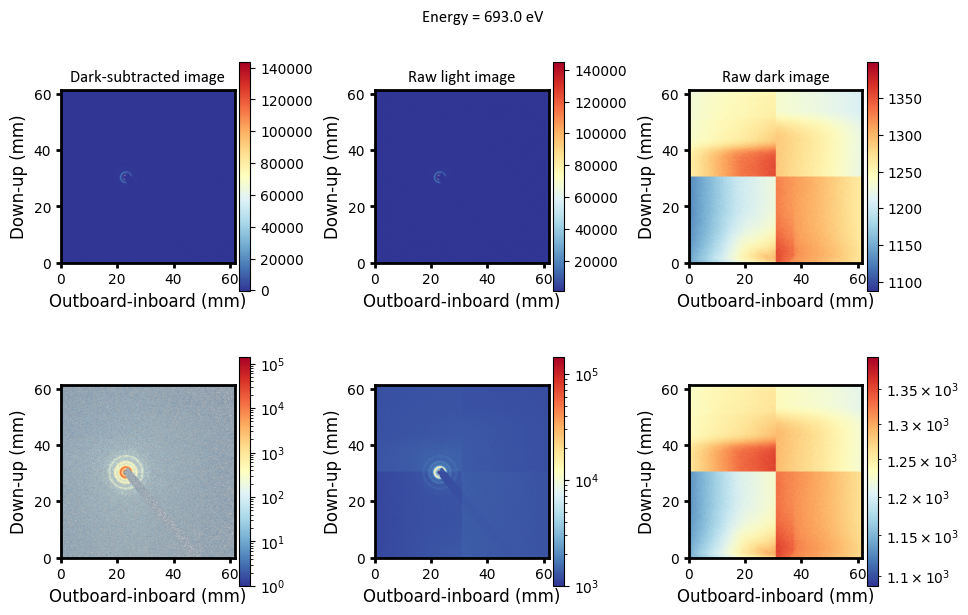

In [49]:
view_single_image(
    scan=scan,
    scan_light=scan_light,
    energy_view_image = 693,
)

### Draw a mask over unwanted features

If you already have a mask file from beam alignment and do not want to change anything, just run the code below and move to the next block.

If you want to make a custom mask for this sample, do the following. Use the mask drawing tool to conceal parts of the image that are not related to the sample such as the beamstop, slit scattering, etc.  If unable to draw a mask directly onto the image via clicking, hover over the desired vertices and copy the coordinates to an existing mask file.  Note that the pix_y and pix_x seen while hovering over the image; values for pix_y should be entered into the x section of the mask file and vice versa.

TODO: Dean has an automated algorithm for mask drawing.  Merge here.

In [50]:
scan_single_image = scan.sel(energy=693, method="nearest")


from PyHyperScattering.IntegrationUtils import DrawMask
mask = DrawMask(scan_single_image)
mask.ui()

Usage: click the "PolyAnnotator" tool at top right.  DOUBLE CLICK to start drawing a masked object, SINGLE CLICK to add a vertex, then DOUBLE CLICK to finish.  Click/drag individual vertex to adjust.


:Layout
   .DynamicMap.I :DynamicMap   []
      :Overlay
         .Image.I    :Image   [pix_y,pix_x]   (Wide Angle CCD Detector_image)
         .Polygons.I :Polygons   [x,y]   (Label,Value)
   .Annotator.I  :Overlay
      .Table.PolyAnnotator          :Table   [Label]
      .Table.PolyAnnotator_Vertices :Table   [x,y]   (Value)

### Define beam center

This step loads the mask onto the scan and sets a beam center by adjusting the x and y coordinates.  Two rings are plotted on top of the image, and their size can be adjusted such that they are superimposed on top of scattering rings in the scan. It is good to start with strongly scattering sample with clear rings, and then the selected beam center can be used for other samples taken around a similar time as the reference sample.  Even more ideally, an automated beam centering algorithm should be used.

TODO: NIST RSoXS team has various workflows to varying degrees of automation.  Update below with optimal workflow.

C:\Users\pmk\AppData\Local\miniforge3\envs\20250616_1\Lib\site-packages\PyHyperScattering\PFGeneralIntegrator.py:145: UserWarning: Since mask was none, creating an empty mask with shape (1024, 1026)
  self.calibrationFromTemplateXRParams(template_xr)
C:\Users\pmk\AppData\Local\miniforge3\envs\20250616_1\Lib\site-packages\PyHyperScattering\IntegrationUtils.py:184: FutureWarning: Passing literal json to 'read_json' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  dflist.append(pd.read_json(item))


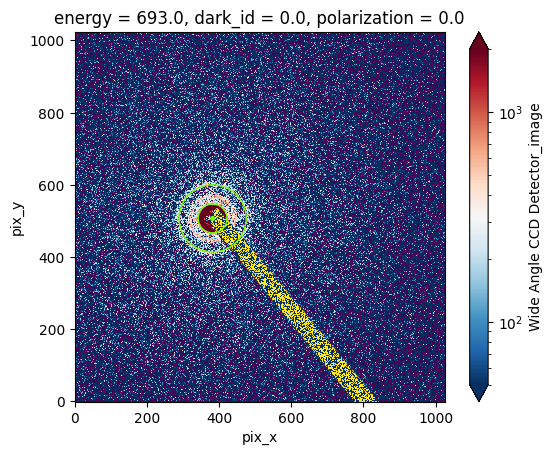

In [61]:
scan_to_integrate = phs.integrate.PFEnergySeriesIntegrator(geomethod='template_xr',template_xr = scan)
mask.load(r"BeamstopMask_Format_20230216.msk") ## Update mask file path

scan_to_integrate.mask = mask.mask
scan_to_integrate.npts=400

## Manually change x and y coordinates as well as ring diameters to get the correct beam center
scan_to_integrate.ni_beamcenter_x = 382
scan_to_integrate.ni_beamcenter_y = 507
phs.IntegrationUtils.Check.checkAll(scan_to_integrate,scan_single_image,img_min=50,img_max=2000,d_inner=40,d_outer=93)

plt.show()

### Azimuthally integrate data

The points along the same radius are integrated such that the 2D image is collapsed into a 1D plot of intensity (I) vs. scattering vector (q).

In [67]:
scan_azimuthally_integrated = scan_to_integrate.integrateImageStack(scan)

100%|██████████████████████████████████████████████████████████████████████████████████| 56/56 [00:16<00:00,  3.35it/s]


### Plot I vs. q and export reduced data

C:\Users\pmk\AppData\Local\Temp\ipykernel_16736\1341309310.py:50: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout() ## This ensures that subplots don't overlap


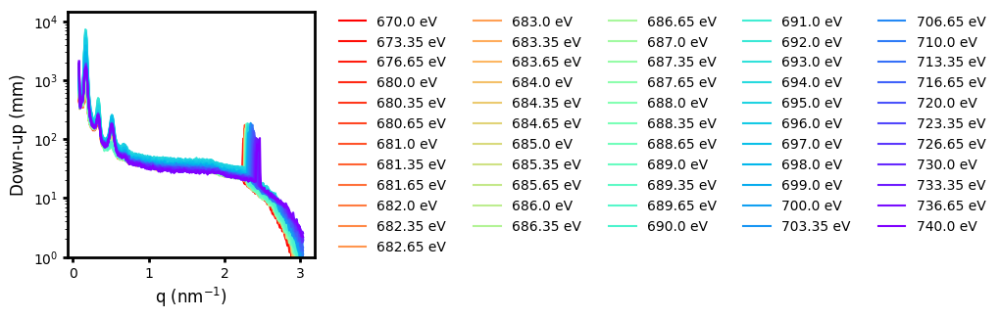

In [75]:
energies_view = "All" ## Examples: energies_view = [693, 700], energies_view = "All"

## Export parameters
export = True
file_path_export = r"G:/Shared drives/NISTPostdoc/CharacterizationData/BeamTime/20250528_SST1_Commissioning/"
file_name_export = r"scanID49931_uid8fcb6fd3-bcb3-4e18-a45b-6d1b21272c45"



qs, intensities_azimuthally_integrated = {}, {}
if energies_view == "All": energies_view = np.array(scan_azimuthally_integrated["energy"])
plot_colors = cm.rainbow(np.linspace(1, 0, len(energies_view)))

## Plotting
number_rows, number_columns = 1, 1
fig, axs = plt.subplots(number_rows, number_columns, figsize=(number_columns*3.25, number_rows*3.25), edgecolor=(0, 0, 0, 0), linewidth=3) #figsize=(3.25, 3.25) for figure
## Ensure axs always stays a 2D array
if number_rows == 1 and number_columns == 1: axs = np.array([[axs]])
if number_rows == 1 and number_columns > 1: axs = axs.reshape(1, number_columns)
if number_rows > 1 and number_columns == 1: axs = axs.reshape(number_rows, 1)

for index_energy, energy_view in enumerate(energies_view):
    plot_label = str(round(energy_view,3)) + " eV"
    plot_color = plot_colors[index_energy]

    q = scan_azimuthally_integrated.sel(energy=energy_view)["q"]*10 ## Multiplying by 10 to convert from [Å-1] to [nm-1]
    intensity_azimuthally_integrated = scan_azimuthally_integrated.sel(energy=energy_view, chi=slice(-180, 180)).mean("chi").data
    qs[plot_label], intensities_azimuthally_integrated[plot_label] = q, intensity_azimuthally_integrated

    axs[0, 0].plot(q, intensity_azimuthally_integrated, label=plot_label, marker=".", markersize=0, color=plot_color, linestyle="solid")

## Plot Formatting
for index_row in np.arange(0, number_rows, 1):
    for index_column in np.arange(0, number_columns, 1):
        ax = axs[index_row, index_column]
        ## Subplot and axes labels
        ax.set_xlabel("q (nm$^{-1}$)", color=(0, 0, 0, 1), size=12)
        ax.set_ylabel("Down-up (mm)", color=(0, 0, 0, 1), size=12)
        ## Axes scaling and ranges
        ax.set_xscale("linear")
        ax.set_yscale("log")
        #ax.set_xlim([0,0.08])
        ax.set_ylim(bottom=1)
        ## Border formatting
        for Border in np.array(["top", "bottom", "left", "right"]):
            ax.spines[Border].set_linewidth(2) ## axes/border linewidths
            ax.spines[Border].set_color((0, 0, 0, 1)) ## axes/border colors
        for Axis in np.array(["x", "y"]): ax.tick_params(axis=Axis, colors=(0, 0, 0, 1), width=2)
        ax.legend(ncol=5, loc="center left", bbox_to_anchor=(1.05, 0.5), edgecolor=(1, 1, 1, 1))
plt.tight_layout() ## This ensures that subplots don't overlap
plt.show()

## Exporting
if export:
    time_stamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S") ## Can add timestamp to avoid overwriting different versions of data reduction for the same sample
    file_name_export = "Reduced" + str(time_stamp) + file_name_export + ".xlsx"

    qs_dataframe, intensities_azimuthally_integrated_dataframe = pd.DataFrame(qs), pd.DataFrame(intensities_azimuthally_integrated)
    if os.path.exists(os.path.join(file_path_export, file_name_export)):
        with pd.ExcelWriter(os.path.join(file_path_export, file_name_export), mode='a') as writer: qs_dataframe.to_excel(writer, sheet_name="q", index=True)
    else: qs_dataframe.to_excel(os.path.join(file_path_export, file_name_export), sheet_name="q", index=True)
    if os.path.exists(os.path.join(file_path_export, file_name_export)):
        with pd.ExcelWriter(os.path.join(file_path_export, file_name_export), mode='a') as writer: intensities_azimuthally_integrated_dataframe.to_excel(writer, sheet_name="intensity", index=True)
    else: intensities_azimuthally_integrated_dataframe.to_excel(os.path.join(file_path_export, file_name_export), sheet_name="intensity", index=True)